# Purpose: Using real streaks to tune the parameters that my difference image preprocessing algorithm would use. I first used a CNN which I had trained without differenced images that was extremely sensitive to filter out images 

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [ ]:
from tensorflow.keras.models import load_model
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import LinearStretch, ZScaleInterval, ImageNormalize
from astropy.io import fits
from astropy import wcs
import skimage
import random
import scipy.stats as stats
import pickle as pkl
from functools import partial
from multiprocessing import Pool
import cupy as cp
from cupyx.scipy.ndimage.filters import convolve
import tensorflow as tf
from tf_explain.core import GradCAM, SmoothGrad, IntegratedGradients, OcclusionSensitivity
import efficientnet.tfkeras as efn
import innvestigate
import reproject
import astroscrappy
import subprocess
import sep
from photutils import detect_threshold, detect_sources, deblend_sources, source_properties
from keras.backend.tensorflow_backend import set_session
import math
import os
from tqdm.notebook import tqdm
from matplotlib.backends.backend_pdf import PdfPages
from PIL import Image
import urllib.request

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

    except RuntimeError as e:
        print(e)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
Error in sys.excepthook:
Traceback (most recent call last):
  File "/opt/anaconda/anaconda3/lib/python3.7/tokenize.py", line 385, in find_cookie
    line_string = line.decode('utf-8')
UnicodeDecodeError: 'utf-8' codec can't decode byte 0x85 in position 0: invalid start byte

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/anaconda/anaconda3/lib/python3.7/linecache.py", line 47, in getlines
    return updatecache(filename, module_globals)
  File "/opt/anaconda/anaconda3/lib/python3.7/linecache.py", line 136, in updatecache
    with tokenize.open(fullname) as fp:
  File "/opt/anaconda/anaconda3/lib/python3.7/tokenize.py", line 449, in open
    encoding, lines = detect_encoding(buffer.readline)
  File "/opt/a

In [3]:
# size = 80
# step = 50
# model = load_model("/home/fwang/wandb/run-20200419_062135-rljo4afi/model-best_0.0004998333888703765_0.9704852426213106_0.9609805.h5")
# thresh = 0.9609805

# size = 80
# step = 50
# model = load_model("/home/fwang/wandb/run-20200519_194207-xixqjezt/model-best_0.0005714285714285715_0.9702380952380952_0.95495033.h5")
# thresh = 0.95495033

# note: this one is size = 200
# size = 200
# step = 150
# model = load_model("/home/fwang/wandb/run-20200603_183225-wedotq6j/model-best_0.00037142857142857143_0.9706666666666667_0.9968531.h5")
# # thresh = 0.9968531
# # the threshold is way too harsh, so set it to 0.99 instead
# thresh = 0.97

# size = 150
# step = 100
# thresh = 0.97370505
# model = load_model("/home/fwang/wandb/run-20200613_185519-1fonehu2/model-best_0.0008857142857142857_0.9700952380952381_0.97370505.h5")

# size = 150
# step = 100
# thresh = 0.98012877
# model = load_model("/home/fwang/wandb/run-20200625_053040-77dw3wdm/model-best_0.0007413647851727043_0.9703664700926706_0.98012877.h5")

size = 150
step = 100
thresh = 0.95
model = load_model("/home/fwang/wandb/run-20200627_210846-bz2nhb2v/model-best_0.00045492839090143216_0.9705981465880371_0.99692285.h5")

# size = 150
# step = 100
# thresh = 0.99
# model = load_model("/home/fwang/wandb/run-20200718_035504-q0giukcp/model-best_0.00038753159224936813_0.9705560235888795_0.99604964.h5")

In [4]:
# align the reference file to the science, returns science and reference
def swarp_align(sci_file, ref_file, use_cached=True):
    ref, header = fits.getdata(ref_file, header=True)

    filename_sci = sci_file.split("/")[-1]
    if ".fits.fz" in filename_sci:
        directory = "/media/rd1/ztf_neos/pipeline/resampled/" + filename_sci[:-len(".fits.fz")]
    else:
        directory = "/media/rd1/ztf_neos/pipeline/resampled/" + filename_sci[:-len(".fits")]
    
    failed = False
    
    if os.path.exists(directory) and use_cached:
        try:
            return [fits.getdata(directory + "/coadd.fits"), ref]
        except:
            # if this fails it means that this was one of the files that got truncated
            failed = True
    
    if not os.path.exists(directory) or not use_cached or failed:
        
        os.makedirs(directory, exist_ok=True)
        with open(directory + "/coadd.head", "w") as f:
            f.write(repr(header) + "\nEND     ")

        subprocess.run(["swarp", sci_file, "-c", "/home/fwang/Pipeline/swarp.conf", "-VERBOSE_TYPE", "QUIET"],
                         cwd=directory, stderr=subprocess.DEVNULL)
                       
    return [fits.getdata(directory + "/coadd.fits"), ref]

In [5]:
contrast = 0.35

def linear_regression(x, y, w):
    B = cp.matmul(x.T, cp.expand_dims(cp.multiply(w, y), -1))
    B2 = cp.linalg.inv(cp.matmul(x.T, cp.multiply(cp.expand_dims(w, -1), x)))
    return cp.matmul(B2, B)[..., 0]
    # note: all the weights are either zero or one so there's no need to do this
#     w = cp.sqrt(w)
#     x_prime = cp.multiply(cp.expand_dims(w, -1), x)
#     y_prime = cp.multiply(w, y)
    # looks like this doesn't works since pinv doesn't have option for number of dims
#     return cp.matmul(cp.linalg.pinv(x_prime), y_prime)


def weighted_std(values, weights):
    average = cp.expand_dims(cp.average(values, weights=weights, axis=-1), -1)
    # Fast and numerically precise:
    variance = cp.average((values - average) ** 2, weights=weights, axis=-1)
    return cp.sqrt(variance)


# for some reason CuPy just doesn't have median function, this function takes in a presorted array
def get_median_sorted(arr):
    length = arr.shape[-1]
    return (arr[..., length // 2] + arr[..., (length - 1) // 2]) / 2


def normalize_cuda(arr, nsamples=size * size // 8):

    values = cp.reshape(arr, (len(arr), size * size))
    stride = (size * size) // nsamples

    samples = cp.array(values[::, ::stride][::, :nsamples], dtype=cp.float32)
    samples.sort()

    npix = nsamples
    nimage = len(arr)

    x = cp.arange(npix)
    x_fit = cp.stack((x, cp.ones(x.shape)), axis=-1)

    # pixels mask used in k-sigma clipping
    goodpix = cp.ones((nimage, npix))

    ngrow = max(1, int(npix * 0.01))
    kernel = cp.ones((1, ngrow))

    for niter in range(3):
        fit = linear_regression(x_fit, samples, goodpix)
        slope = fit[:, 0]
        intercept = fit[:, 1]

        fitted = cp.expand_dims(slope, 1) * cp.expand_dims(x, 0) + cp.expand_dims(intercept, 1)

        # Subtract fitted line from the data array
        flat = samples - fitted

        # Compute the k-sigma rejection threshold
        threshold = cp.expand_dims(2.5 * weighted_std(flat, goodpix), -1)

        # Detect and reject pixels further than k*sigma from the
        # fitted line
        goodpix[(flat < - threshold) | (flat > threshold)] = 0

        goodpix = 1 - cp.clip(convolve(1 - goodpix, kernel), 0, 1)

    if contrast > 0:
        slope = slope / contrast
    center_pixel = (npix - 1) // 2
    median = get_median_sorted(samples)

    vmin = median - (center_pixel - 1) * slope
    vmax = median + (npix - center_pixel) * slope

    old_min = cp.min(samples, axis=1)
    old_max = cp.max(samples, axis=1)

    vmin = cp.maximum(vmin, old_min)
    vmax = cp.minimum(vmax, old_max)

    vmin = cp.reshape(vmin, (len(arr), 1, 1))
    vmax = cp.reshape(vmax, (len(arr), 1, 1))

    arr -= vmin
    arr /= vmax - vmin

    arr = cp.clip(arr, 0, 1)

    sorted_arr = cp.sort(cp.reshape(arr, (len(arr), 1, -1)))

    median_arr = cp.expand_dims(get_median_sorted(sorted_arr), -1)

    # makes more sense to use median due to large number of outliers
    arr = (arr - median_arr) / cp.std(arr, axis=(1, 2), keepdims=True)

    return arr


def normalize(arr, samples=size * size // 8):
    arr = np.copy(arr)
    vmin, vmax = ZScaleInterval(samples).get_limits(arr)
    arr -= vmin
    arr /= vmax - vmin
    arr = np.clip(arr, 0, 1)

    return (arr - np.nanmedian(arr, axis=(0, 1), keepdims=True)) / np.nanstd(arr, axis=(0, 1), keepdims=True)
    
#     return (arr - 0.5) * 2

In [6]:
def display_triplet(pair, title=None, normalized=True):
    if not normalized:
        pair[0] = normalize(pair[0])
        pair[1] = normalize(pair[1])
    plt.figure(figsize=(10, 3))
    if title is not None:
        plt.suptitle(title)
    plt.subplot(1, 3, 1)
    plt.imshow(pair[0], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.imshow(pair[1], cmap="gray")
    plt.subplot(1, 3, 3)
    pair_input = np.transpose([pair], (0, 2, 3, 1))
    outputs, guided_grads = GradCAM.get_gradients_and_filters(model, pair_input, "conv2d_2", 0)
    cam = GradCAM.generate_ponderated_output(outputs, guided_grads)
    plt.imshow(cam[0], cmap="inferno")

In [7]:
# loading the real data filenames
with open("/home/fwang/savelinksztfvisiblemetadata.pkl", "rb") as f:
    metadata = pkl.load(f)

In [8]:
filenames = glob.glob("/mnt/etdisk9/ztf_neos/ztf_visible/science/*.fits")

In [9]:
# the "real" data
pairs = []
diffs = []
sci_files = []
ref_files = []
diff_files = []
diff_imgs = []
bounds = []

for sci_file in tqdm(filenames):
    
    sci_meta = metadata[sci_file.split("/")[-1]]
    
    ref_file = sci_meta["ref_file"]
    diff_file = sci_meta["diff_file"]
    
    if not os.path.exists(ref_file) or not os.path.exists(sci_file) or not os.path.exists(diff_file):
        continue
    
    sci, ref = swarp_align(sci_file, ref_file)
    
    diff, ref = swarp_align(diff_file, ref_file)
    
#     diff, diff_header = fits.getdata(diff_file, header=True)
    
    diff_imgs.append(diff)
    
    wcs_ref = wcs.WCS(ref_file)
    x, y = wcs_ref.all_world2pix([[sci_meta["ra"], sci_meta["dec"]]], 0, ra_dec_order=True)[0]
    x = int(x)
    y = int(y)
    
    sci_crop = sci[y-size//2:y+size//2, x-size//2:x+size//2]
    ref_crop = ref[y-size//2:y+size//2, x-size//2:x+size//2]
    diff_crop = diff[y-size//2:y+size//2, x-size//2:x+size//2]
    
#     wcs_diff = wcs.WCS(diff_header)
#     x, y = wcs_diff.all_world2pix([[sci_meta["ra"], sci_meta["dec"]]], 0, ra_dec_order=True)[0]
#     x = int(x)
#     y = int(y)
#     diff_crop = diff[y-size//2:y+size//2, x-size//2:x+size//2]
    
    pairs.append([sci_crop, ref_crop])
    diffs.append(diff_crop)
    
    sci_files.append(sci_file)
    ref_files.append(ref_file)
    diff_files.append(diff_file)
    
    bounds.append([(x-size//2, y-size//2), (x+size//2, y+size//2)])

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [10]:
pairs_filtered = []
sci_filtered = []
ref_filtered = []
bounds_filtered = []
indicies = np.arange(len(pairs))
indicies_filtered = []
for pair, sci_file, ref_file, bound, index in tqdm(list(zip(pairs, sci_files, ref_files, bounds, indicies))):
    if pair[0].shape[0] == 0 or pair[0].shape[1] == 0 or pair[1].shape[0] == 0 or pair[1].shape[1] == 0 \
        or np.sum(~np.isfinite(pair[0])) > 30 or np.sum(~np.isfinite(pair[1])) > 30 \
        or np.sum(pair[1] == 0) > 30:
        continue
    sci = np.array(pair[0], dtype=np.float32)
    sci[~np.isfinite(sci)] = sep.Background(sci).globalback
    ref = np.array(pair[1], dtype=np.float32)
    ref[~np.isfinite(ref)] = sep.Background(ref).globalback
    pairs_filtered.append((sci, ref))
    sci_filtered.append(sci_file)
    ref_filtered.append(ref_file)
    bounds_filtered.append(bound)
    indicies_filtered.append(index)

[[72.304115 72.296616 72.28833  ... 74.98791  75.07239  75.15719 ]
 [72.33196  72.324745 72.31675  ... 75.01969  75.10354  75.18768 ]
 [72.360245 72.35332  72.34562  ... 75.051765 75.134964 75.21845 ]
 ...
 [74.31606  74.35624  74.3968   ... 78.42626  78.422806 78.419205]
 [74.29224  74.33284  74.373825 ... 78.42737  78.42345  78.41939 ]
 [74.268234 74.30925  74.35065  ... 78.42837  78.42398  78.41945 ]]


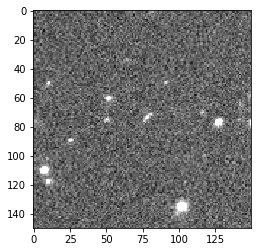

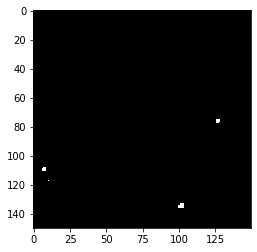

In [59]:
i = 400
plt.imshow(normalize(pairs_filtered[i][0]), cmap="gray")
plt.figure()
bkg = sep.Background(pairs_filtered[i][0])
print(bkg.rms() * 15)
plt.imshow(pairs_filtered[i][0] > bkg.rms() * 15, cmap="gray")

In [ ]:
print(ref_filtered[0])
print(diff_files[indicies_filtered[0]])
diff_test, ref_test = swarp_align(diff_files[indicies_filtered[0]], ref_filtered[0])

In [11]:
pairs_arr = np.array(pairs_filtered)
pairs_arr = np.reshape(pairs_arr, (-1, size, size))
pairs_arr = normalize_cuda(cp.array(pairs_arr, dtype=cp.float32)).get()
pairs_arr = np.reshape(pairs_arr, (-1, 2, size, size))
pairs_arr_transpose = np.transpose(pairs_arr, [0, 2, 3, 1])

In [14]:
preds = model.predict(pairs_arr_transpose, verbose=1, batch_size=1)

801/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [18]:
true_indicies = np.array(indicies_filtered)[preds.flatten() > 0.95]

In [13]:
for diff_img in tqdm(diff_imgs):
    diff_img[diff_img == 0] = np.nan

In [19]:
# diff_stds = []
for index in tqdm(true_indicies):
    diff_img = diff_imgs[index]
#     if np.sum(~np.isfinite(diff_img)) == 0:
    diff_img[diff_img == 0] = np.nan
#         diff_img[diff_img < np.min(diff_img) + 1] = np.nan
#     diff_stds.append(cp.nanstd(cp.array(diff_img)).get())
#     diff_stds.append(np.nanstd(diff_img))

In [22]:
diff_stds

[array(9.7680025, dtype=float32),
 array(8.769994, dtype=float32),
 array(11.224914, dtype=float32),
 array(8.012986, dtype=float32),
 array(7.3397, dtype=float32),
 array(7.3779693, dtype=float32),
 array(7.8835354, dtype=float32),
 array(6.6474085, dtype=float32),
 array(7.0577908, dtype=float32),
 array(6.556029, dtype=float32),
 array(8.15997, dtype=float32),
 array(7.9196835, dtype=float32),
 array(17.347872, dtype=float32),
 array(7.349986, dtype=float32),
 array(17.673315, dtype=float32),
 array(9.037102, dtype=float32),
 array(8.136136, dtype=float32),
 array(7.370318, dtype=float32),
 array(8.310635, dtype=float32),
 array(7.8965735, dtype=float32),
 array(16.583363, dtype=float32),
 array(17.684347, dtype=float32),
 array(14.824083, dtype=float32),
 array(20.767878, dtype=float32),
 array(14.162428, dtype=float32),
 array(23.21706, dtype=float32),
 array(13.943101, dtype=float32),
 array(21.528315, dtype=float32),
 array(17.936115, dtype=float32),
 array(20.19325, dtype=float

In [114]:
mask = np.array([[True, False, True], [False, True, False]])
print(np.where(mask))

(array([0, 0, 1]), array([0, 2, 1]))


In [14]:
from unionfind import UnionFind

In [20]:
from astropy.convolution import Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma
import scipy.stats

# size = 5
# sigma = size * gaussian_fwhm_to_sigma
# kernel = Gaussian2DKernel(sigma, x_size=size, y_size=size)
# kernel.normalize()

def distance(bbox, middle, use_arr=False):
    if use_arr:
        xs = [bbox[1], bbox[3]]
        ys = [bbox[0], bbox[2]]
    else:
        xs = [bbox.ixmin, bbox.ixmax]
        ys = [bbox.iymin, bbox.iymax]
    
    return min([((middle[0] - x) ** 2 + (middle[1] - y) ** 2) ** 0.5 for x in xs for y in ys])


def rotate(points, angle):
    
    angle = np.deg2rad(angle)
    R = np.array([[np.cos(angle), -np.sin(angle)],
                  [np.sin(angle),  np.cos(angle)]])
    
    return np.dot(R, points.T).T


def get_lin_correlation(mask):
    y, x = np.where(mask)
    r1, p = scipy.stats.pearsonr(x, y)
    
    pts = rotate(np.array(list(zip(x, y))), 45)
    
    x, y = zip(*pts)
    r2, p = scipy.stats.pearsonr(x, y)
    
    return max(abs(r1), abs(r2))


def process_diff(diff, std=None):
    
    if std is None:
        std = np.nanstd(diff)

    segm = detect_sources(diff, std, 10, connectivity=8) #, filter_kernel=kernel)
    
    if segm is None:
        return [], 0, segm

    info = [source for source in source_properties(diff, segm)]
#     info = [source for source in info if abs(get_lin_correlation(~source.data_cutout_ma.mask)) > 0.2]
    
    num_sources = len(info)
    
    info = [source for source in info if distance(source.bbox, (75, 75)) < 20]
    
    return info, num_sources, segm

In [21]:
import skimage.measure

In [98]:
diff_imgs[10][diff_imgs[10] < np.min(diff_imgs[10]) + 1] = np.nan

In [62]:
print(bounds[0])

[(2926, 1602), (3076, 1752)]


In [117]:
from unionfind import UnionFind

In [22]:
from collections import deque
import scipy.ndimage as ndi
from skimage.morphology import convex_hull_image

In [23]:
%%timeit
diff = diff_imgs[np.random.choice(true_indicies)].astype(np.float32)
# print(diff.shape)

def extract_object_slices(diff, factor=1.3, area_thresh=15, upper_area_thresh=40, solidity_thresh=0.5):
    bkg = sep.Background(diff)
    rms = bkg.rms()
    thresh = rms * factor + bkg.back()

    mask = diff > thresh

    labels = skimage.measure.label(mask, connectivity=2)

    objects = ndi.find_objects(labels)

    filtered = []

    for i, sl in enumerate(objects):

        y = sl[0].stop - sl[0].start
        x = sl[1].stop - sl[1].start

        if y * x < area_thresh:
            continue

        label = i + 1

        img_mask = labels[sl] == label
        area = np.sum(img_mask)

        if area >= area_thresh:
            if area >= upper_area_thresh:
                filtered.append(sl)
            else:
                solidity = area / np.sum(convex_hull_image(img_mask))
                if solidity > solidity_thresh:
                    filtered.append(sl)
    
    return filtered

extract_object_slices(diff)

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':


958 ms ± 128 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


1 1


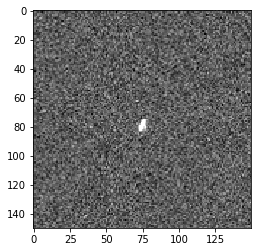

In [24]:
def process_diff(diff, factor=1.3, dist=0, postdist=0):
    
    bkg = sep.Background(diff)
    rms = bkg.rms()
    thresh = rms * factor + bkg.back()
    
    mask = diff > thresh
    
#     plt.figure(figsize=(5,5))
#     plt.imshow(mask)
#     plt.figure(figsize=(5,5))

    if dist > 0:
        kernel_size = int(dist * 2 + 1)
        kernel = np.zeros((kernel_size, kernel_size))
        for i in range(kernel_size):
            for j in range(kernel_size):
                if (i - dist) ** 2 + (j - dist) ** 2 <= dist ** 2:
                    kernel[i][j] = 1

        mask_convolved = convolve(cp.array(mask), cp.array(kernel)).get().astype(bool)

    else:
        
        mask_convolved = mask
    
#     plt.imshow(mask_convolved)
#     plt.figure(figsize=(5,5))
    
    labels = skimage.measure.label(mask_convolved, connectivity=2)
    props = skimage.measure.regionprops(labels, diff)
    
#     filtered_labels = np.zeros(diff.shape, dtype=int) - 1
    
#     filtered = []
    
#     for prop in props:
#         if prop.area >= 5: # and prop.area / np.sum(prop.convex_image) > 0.3: # and prop.eccentricity > 0.5:
            
#             bbox = prop.bbox
#             filtered_labels [bbox[0]:bbox[2], bbox[1]:bbox[3]][prop.image] = len(filtered)
            
#             filtered.append(prop)
#             print(prop.area / np.sum(prop.convex_image))
#             plt.figure(figsize=(2, 2))
#             plt.subplot(1, 3, 1)
#             plt.imshow(prop.convex_image)
#             plt.subplot(1, 3, 2)
#             plt.imshow(prop.intensity_image)
#             plt.subplot(1, 3, 3)
#             plt.imshow(prop.filled_image)
    
#     plt.figure()
#     plt.imshow(labels)
    
#     print(len(filtered))
    
#     plt.figure(figsize=(5,5))
#     plt.imshow(filtered_labels)

#     uf = UnionFind(len(filtered))
#     for y in range(diff.shape[0]):
#         for x in range(diff.shape[1]):
#             if filtered_labels[y, x] == -1:
#                 continue
#             for i in range(-postdist, postdist + 1):
#                 for j in range(-postdist, postdist + 1):
#                     if i ** 2 + j ** 2 <= postdist ** 2 and 0 <= y + i < diff.shape[0] and 0 <= x + j < diff.shape[1]:
#                         if filtered_labels[y, x] != filtered_labels[y + i, x + j] and filtered_labels[y + i, x + j] != -1:
#                             uf.union(filtered_labels[y, x], filtered_labels[y + i, x + j])
    
#     for i in range(len(filtered)):
#         filtered_labels[filtered_labels == i] = uf.find(i)
    
#     plt.figure(figsize=(5,5))
#     plt.imshow(filtered_labels)
    
#     props = skimage.measure.regionprops(filtered_labels + 1, diff)
    
    filtered = []
    
    for prop in props:
        # if the solidity is low that usually is if the streak is super long, also if the solidity is 1 then it is usually an artifact
        if prop.area >= 15 and prop.solidity < 1 and (prop.solidity > 0.55 or prop.area > 22):
            filtered.append(prop)

    streak = []
    for prop in filtered:
        dist = distance(prop.bbox, (size//2, size//2), use_arr=True)
        if dist < 20:
            streak.append((prop, dist))
#             plt.figure()
#             plt.imshow(prop.intensity_image)
#             position_img = np.zeros(diff.shape, dtype=np.bool)
#             bbox = prop.bbox
#             position_img[bbox[0]:bbox[2], bbox[1]:bbox[3]][prop.image] = 1
#             plt.figure()
#             plt.imshow(position_img)
        
    return filtered, streak
    
img = np.array(diffs[true_indicies[364]], dtype=np.float32)
# img = np.array(diff_imgs[10][1000:2000, 2000:3000])
filtered, streak = process_diff(img)
print(len(filtered), len(streak))
plt.figure()
plt.imshow(normalize(img), cmap="gray")
    
#     kernel = np.zeros((dist * 2 + 1, dist * 2 + 1))
#     for i in range(dist * 2 + 1):
#         for j in range(dist * 2 + 1):
#             if (i - dist) ** 2 + (j - dist) ** 2 <= dist ** 2:
#                 kernel[i][j] = 1
    
#     mask_convolved = convolve(mask, kernel).get()
    
#     y, x = np.where(mask)
    
#     labels = np.zeros(diff.shape)
    
#     for i in range(len(y)):
#         labels[y[i], x[i]] = i
    
#     for i in range(len(y)):
        
    
#     uf = unionfind.UnionFind(len(y))

In [ ]:
%%time
for i in range(200):
    convolve(cp.array(diff_imgs[90]), cp.random.randn(10, 10)).shape

In [26]:
# diff_imgs_processed = []
for i in tqdm(list(range(len(true_indicies)))):
#     diff_copy = np.array(diff_imgs[true_indicies[i]], dtype=np.float32)
    diff_copy = diff_imgs[true_indicies[i]]
    ref = fits.getdata(ref_files[true_indicies[i]]).astype(np.float32)
    bkg = sep.Background(ref)
    mask = ref > (bkg.back() + bkg.rms() * 10)
    bkg_diff = sep.Background(diff_copy.astype(np.float32))
    diff_copy[mask] = bkg_diff.back()[mask]
#     diff_imgs_processed.append((diff_copy, true_indicies[i]))

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


In [27]:
diff_imgs_processed_dict = {}
for i in tqdm(list(range(len(true_indicies)))):
# for diff, index in diff_imgs_processed:
    diff = diff_imgs[true_indicies[i]]
    index = true_indicies[i]
    diff_imgs_processed_dict[index] = diff

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


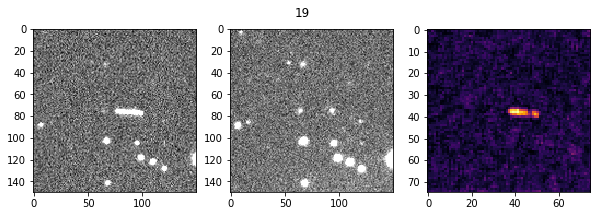

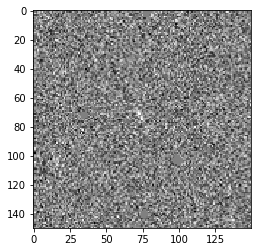

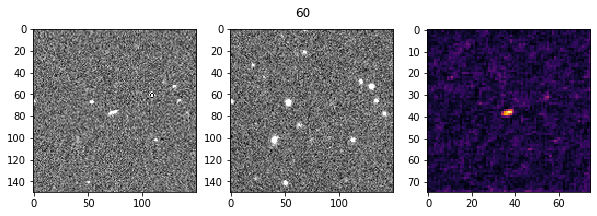

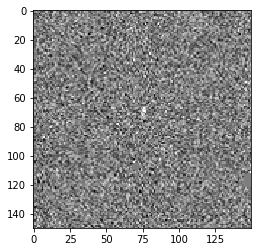

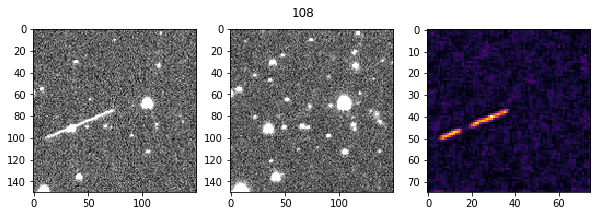

...

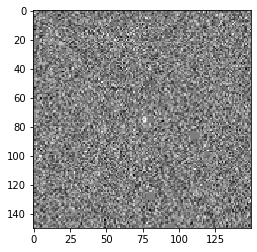

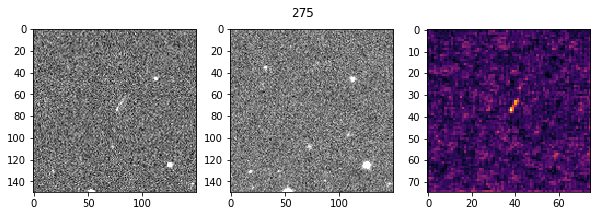

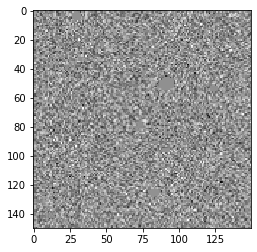

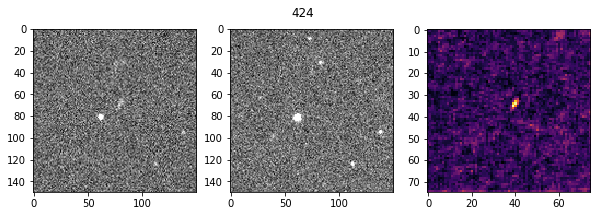

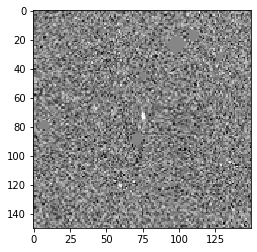

In [28]:
pairs_arr_indicies = np.where(preds.flatten() > 0.5)[0]

num = 0
total = 0
total_found = 0
segms = []
streaks = []

for i in tqdm(list(range(len(true_indicies)))):
    
#     display_triplet(pairs_arr[pairs_arr_indicies[i]], title=pairs_arr_indicies[i])
#     plt.figure()
#     plt.imshow(normalize(diffs[true_indicies[i]]), cmap="gray")
#     plt.figure()
#     plt.imshow(diffs[true_indicies[i]] > diff_stds[i], cmap="gray")
    if preds[pairs_arr_indicies[i]] < 0.95:
        continue

    if np.sum(~np.isfinite(diffs[true_indicies[i]])) > 100 or diffs[true_indicies[i]].shape != (size, size):
        continue
        
    bound = bounds[true_indicies[i]]
    diff_processed = diff_imgs_processed_dict[true_indicies[i]][bound[0][1]:bound[1][1], bound[0][0]:bound[1][0]]
    
    total += 1
    
#     filtered, streak = process_diff(np.array(diffs[true_indicies[i]]))
    filtered, streak = process_diff(np.array(diff_processed, dtype=np.float32))
    streaks.append((true_indicies[i], streak))
    total_found += len(filtered)
    
# #     std = np.nanstd(diffs[true_indicies[i]])
#     try:
#         std = sep.Background(np.array(diffs[true_indicies[i]])).globalrms * 2
#     except:
#         print("failed sep " + str(i))
# #     std = diff_stds[i]
    
#     sources, num_sources, segm = process_diff(diffs[true_indicies[i]], std)#, diff_stds[i])
#     segms.append((segm, i, num_sources))
    
#     total_found += num_sources

#     if len(sources) == 0:
    if len(streak) == 0:
        display_triplet(pairs_arr[pairs_arr_indicies[i]], title=i)
        plt.figure()
        try:
            plt.imshow(normalize(diff_processed), cmap="gray")
        except:
            print("Failed " + str(i))
            pass
#         plt.figure()
#         plt.imshow(diffs[true_indicies[i]] > diff_stds[i], cmap="gray")
#         plt.imshow(diffs[true_indicies[i]] > std * 1.5, cmap="gray")
        

    num += 1

In [29]:
streak_props = []

for i, streak in streaks:
    
    biggest_prop = None
    max_area = 0
    
    for prop, dist in streak:
        if prop.area > max_area:
            max_area = prop.area
            biggest_prop = prop
            
    if biggest_prop is not None:
        streak_props.append((i, biggest_prop))

In [ ]:
filtereds = []
for key in tqdm(list(diff_imgs_processed_dict.keys())[:50]):
    img = np.array(diff_imgs_processed_dict[key])
    filtered, streak = process_diff(img.astype(np.float32))
    filtereds.append(filtered)

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


In [25]:
print([len(filtered) for filtered in filtereds])
print(sum([len(filtered) for filtered in filtereds])/len(filtereds))

[24, 25, 32, 65, 20, 44, 38, 28, 18, 35, 93, 23, 26, 26, 18, 44, 23, 50, 63, 88, 61, 12, 39, 26, 35, 39, 40, 37, 36, 36, 18, 31, 72, 42, 35, 33, 36, 38, 408, 51, 23, 21, 29, 37, 18, 201, 50, 52, 27, 40]
48.12


(array([30., 14.,  4.,  0.,  0.,  1.,  0.,  0.,  0.,  1.]),
 array([ 12. ,  51.2,  90.4, 129.6, 168.8, 208. , 247.2, 286.4, 325.6,
        364.8, 404. ]),
 <a list of 10 Patch objects>)

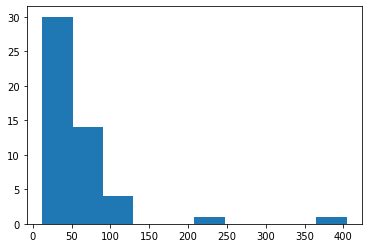

In [26]:
import matplotlib.pyplot as plt
plt.hist([25, 30, 35, 71, 20, 44, 61, 30, 18, 36, 96, 24, 25, 26, 82, 43, 23, 51, 64, 94, 61, 12, 50, 28, 76, 64, 128, 71, 83, 40, 24, 49, 94, 41, 38, 58, 63, 38, 404, 53, 25, 21, 29, 37, 19, 213, 49, 53, 27, 67])

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


IndexError: list index out of range

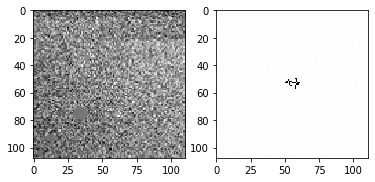

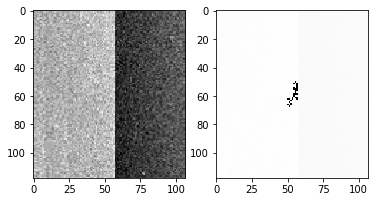

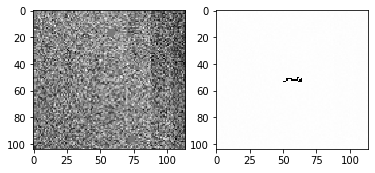

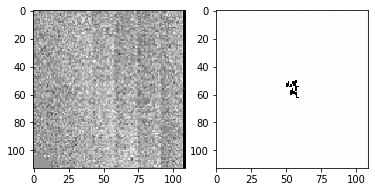

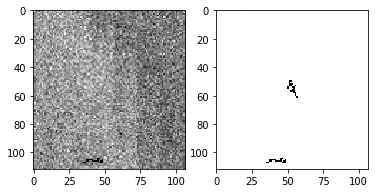

...

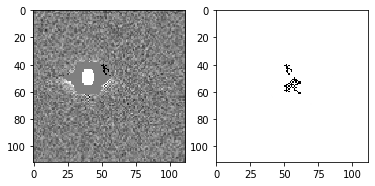

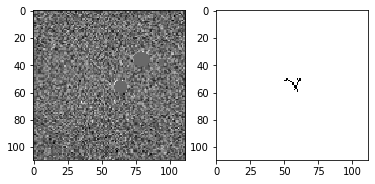

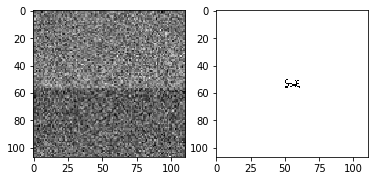

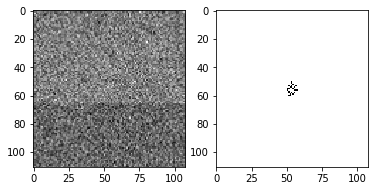

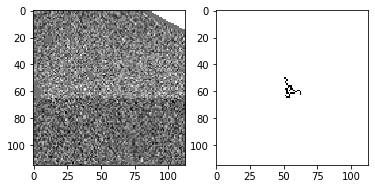

In [27]:
index = 0
for key in tqdm(list(diff_imgs_processed_dict.keys())):
    img = np.copy(diff_imgs_processed_dict[key])
    filtered = filtereds[index]
    
    if len(filtered) > 100:
    
        for prop in np.random.choice(filtered, 20, replace=False):
            plt.figure()
            plt.subplot(1, 2, 1)
            y1, x1, y2, x2 = prop.bbox
            plt.imshow(normalize(img[y1-50:y2+50, x1-50:x2+50]), cmap="gray")
            img[y1:y2, x1:x2] = prop.image * -10000
            plt.subplot(1, 2, 2)
            plt.imshow((img[y1-50:y2+50, x1-50:x2+50]), cmap="gray")
        
    index += 1

In [151]:
filtered = [prop for filtered in filtereds for prop in filtered]

In [152]:
print(len(filtered))

2913


In [41]:
total = 0
for prop in filtered:
    if prop.area > 13:
        total += 1
print(total)

3167


/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


KeyboardInterrupt: 

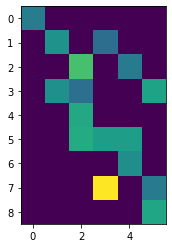

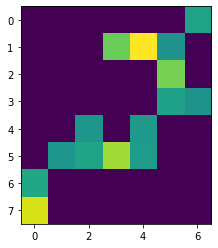

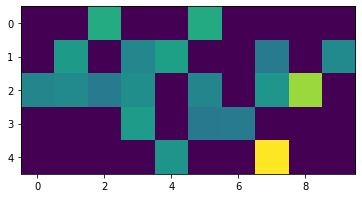

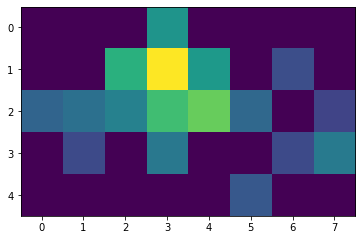

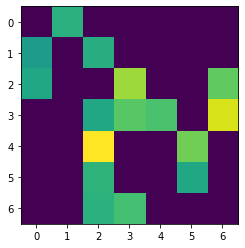

...

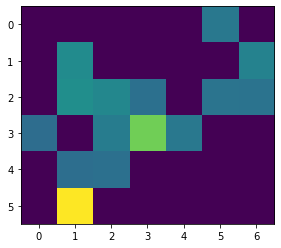

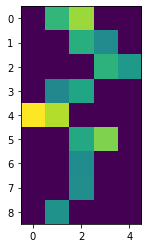

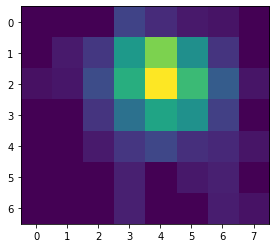

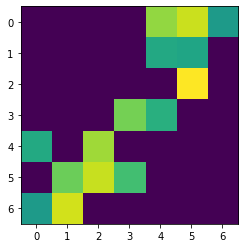

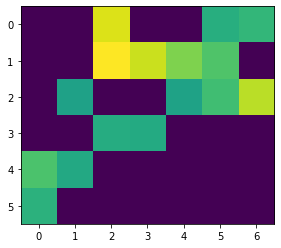

Error in callback <function flush_figures at 0x7f17851e7f80> (for post_execute):


KeyboardInterrupt: 

In [42]:
new_filtered = []
for prop in filtered:
    if prop.area > 13:
        plt.figure()
        plt.imshow(prop.intensity_image)
        new_filtered.append(prop)
filtered = new_filtered

(array([  0.,   0.,   0.,   0.,   0., 779., 453., 298., 194., 149.,  97.,
         82.,  75.,  51.,  36.,  32.,  42.,  35.,  59.]),
 array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
        27, 28, 29]),
 <a list of 19 Patch objects>)

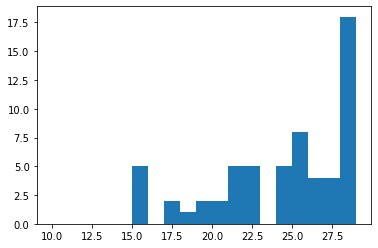

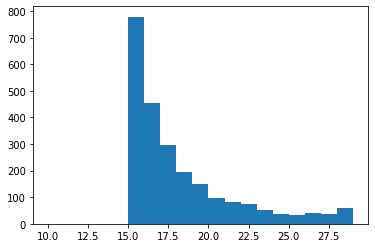

In [46]:
area = [prop[1].area for prop in streak_props]
plt.hist(area, np.arange(10, 30, 1))

plt.figure()
area_filtered = [prop.area for prop in filtered]
plt.hist(area_filtered, np.arange(10, 30, 1))

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """


(array([3.143e+03, 1.400e+01, 5.000e+00, 1.000e+00, 1.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00]),
 array([  0. ,  58.4, 116.8, 175.2, 233.6, 292. , 350.4, 408.8, 467.2,
        525.6, 584. ]),
 <a list of 10 Patch objects>)

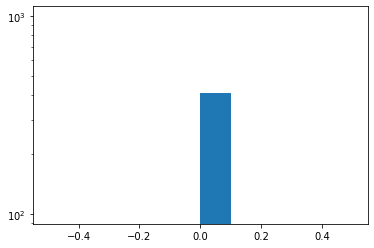

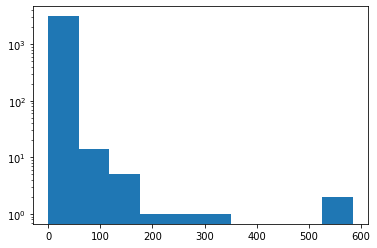

In [47]:
neg_num = [np.sum((prop[1].intensity_image < 0)) + np.sum(np.isnan(prop[1].intensity_image)) for prop in streak_props]
plt.hist(neg_num, log=True)

plt.figure()
neg_num_filtered = [np.sum(prop.intensity_image < 0) + np.sum(np.isnan(prop.intensity_image)) for prop in filtered]
plt.hist(neg_num_filtered, log=True)

(array([   4.,   15.,   25.,   47.,   80.,  137.,  232.,  428.,  763.,
        1436.]),
 array([0.18481467, 0.2663332 , 0.34785173, 0.42937027, 0.5108888 ,
        0.59240733, 0.67392587, 0.7554444 , 0.83696293, 0.91848147,
        1.        ]),
 <a list of 10 Patch objects>)

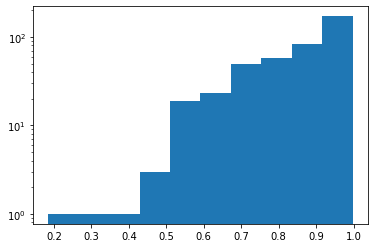

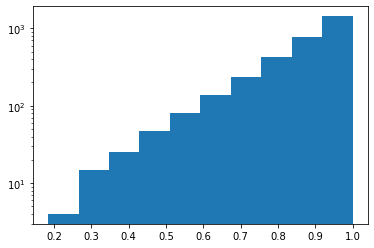

In [48]:
elongations = [prop[1].eccentricity for prop in streak_props]
plt.hist(elongations, log=True)
plt.figure()
elongations_filtered = [prop.eccentricity for prop in filtered]
plt.hist(elongations_filtered, log=True)

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  41.,
         86., 107., 122., 143., 134., 142., 153., 142., 128., 123.,  97.,
        104.,  85.,  93.,  84.,  50.,  61.,  60.,  51.,  46.,  41.,  40.,
         36.,  30.,  28.,  29.,  31.,  19.,  19.,  21.,  20.,  15.,  13.,
         11.,  11.,   9.,   9.,   9.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
        1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5,
        2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8,
        3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9]),
 <a list of 49 Patch objects>)

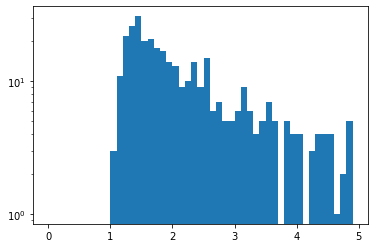

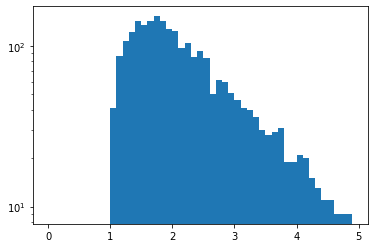

In [49]:
elongations = [prop[1].major_axis_length / prop[1].minor_axis_length for prop in streak_props]
plt.hist(elongations, np.arange(0, 5, 0.1), log=True)
plt.figure()
elongations_filtered = [prop.major_axis_length / prop.minor_axis_length for prop in filtered if prop.minor_axis_length != 0]
plt.hist(elongations_filtered, np.arange(0, 5, 0.1), log=True)

(array([ 11.,  52., 149., 250., 284., 225., 161., 627., 357.]),
 array([0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 , 0.65]),
 <a list of 9 Patch objects>)

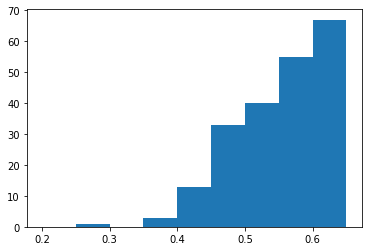

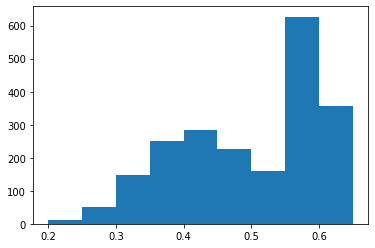

In [153]:
fullness = [prop[1].solidity for prop in streak_props]
plt.hist(fullness, np.arange(0.2, 0.7, 0.05))
plt.figure()
fullness_filtered = [prop.solidity for prop in filtered]
plt.hist(fullness_filtered, np.arange(0.2, 0.7, 0.05))

(array([   5.,    7.,   14.,   66., 2805.]),
 array([-3.5, -2.5, -1.5, -0.5,  0.5,  1.5]),
 <a list of 5 Patch objects>)

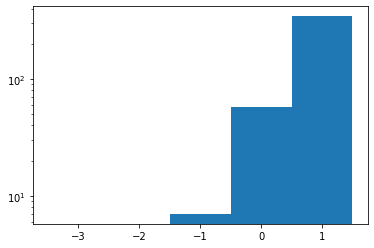

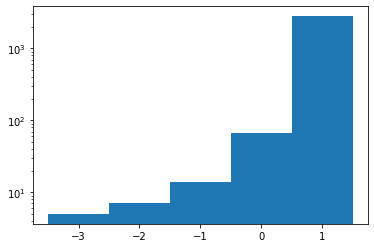

In [154]:
euler = [prop[1].euler_number for prop in streak_props]
plt.hist(euler, np.arange(-3.5, 2.5, 1), log=True)
plt.figure()
euler_filtered = [prop.euler_number for prop in filtered]
plt.hist(euler_filtered, np.arange(-3.5, 2.5, 1), log=True)

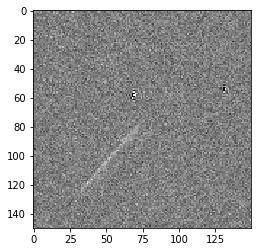

In [105]:
# for i, e in enumerate(euler):
#     if e <= -1:
for i, f in enumerate(fullness):
    if f < 0.3:
        plt.figure()
        plt.imshow(normalize(diffs[streak_props[i][0]]), cmap="gray")
#         print(streak_props[i][1].fullness)

In [35]:
diff_imgs[10][diff_imgs[10] < np.min(diff_imgs[10]) + 1] = np.nan

In [72]:
for f in filtered:
    print(f.area)

44
13
11
10
10
11
25
13
24
13
11
12
16
10
12
27
14
12
19
17
12
10
10
27
10
11
11
10
29
11
10
24
11
11
15
10
21
24
13
10
12
14
11
11
17
10
11
17
14
13
18
10
13
18
12
10
12
11
14
12
12
10
14
12
11
12
34
11
11
11
40
26
10
10
10
14
20
10
20
11
40
12
14
26
14
11
14
13
12
11
13
13
11
28
12
11


/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app
/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


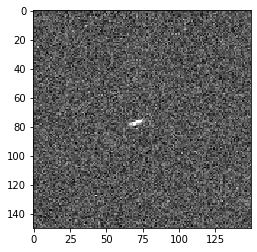

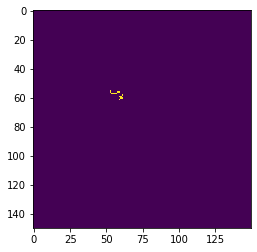

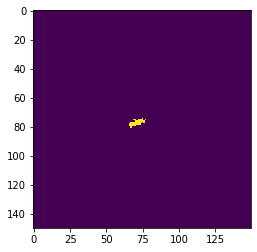

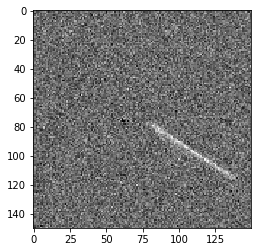

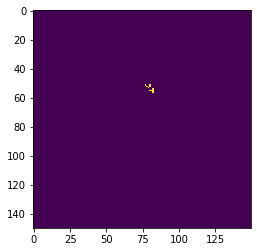

...

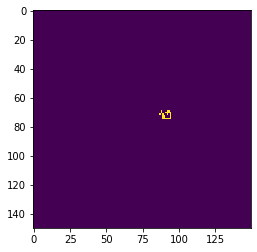

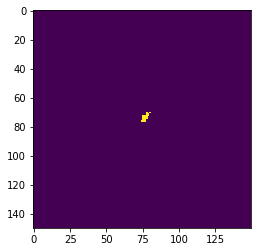

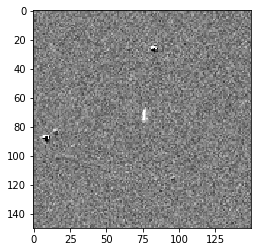

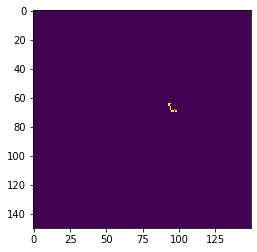

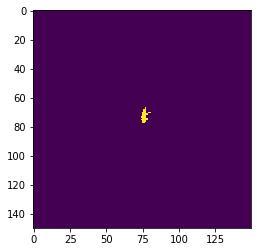

In [21]:
for i, streak in streaks:
    diff = diffs[i]
    if len(streak) > 1:
        
        try:
            plt.figure()
            plt.imshow(normalize(diff), cmap="gray")
        except:
            print(diff.shape)
            
        for prop, dist in streak:
            position_img = np.zeros(diff.shape, dtype=np.bool)
            bbox = prop.bbox
            position_img[bbox[0]:bbox[2], bbox[1]:bbox[3]][prop.image] = 1
            plt.figure()
            plt.imshow(position_img)

In [102]:
print(total_found/total)
print(num, total)

2.3756218905472637
402 402


In [42]:
i = 29
print(segms[i][2])
print(metadata[sci_filtered[pairs_arr_indicies[segms[i][1]]].split("/")[-1]])
plt.imshow(normalize(diffs[true_indicies[segms[i][1]]]), cmap="gray")
plt.figure()
cmap = segms[i][0].make_cmap(random_state=12345)
plt.imshow(np.array(segms[i][0]), cmap=cmap)

IndexError: list index out of range

In [266]:
i = 28
# diff = diffs[true_indicies[segms[i][1]]]
# plt.imshow(normalize(diff), cmap="gray")
diff = diff_imgs[true_indicies[segms[i][1]]]
bkg = sep.Background(diff)
objects, segmap = sep.extract(np.array(diff), 2, err=bkg.rms(), segmentation_map=True, deblend_cont=1.0, minarea=10)
# plt.figure()
# plt.imshow(segmap)

In [267]:
print(np.max(segmap))

1012


In [178]:
print(total_found/total)
print(num/total)

2.803970223325062
0.02729528535980149


In [153]:
import sys
sys.path.insert(1, '/home/fwang/')

In [154]:
import pyradon

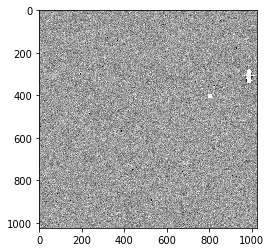

In [176]:
plt.imshow(normalize(diff_imgs[true_indicies[83]][1000:2024, 1000:2024]), cmap="gray")

KeyboardInterrupt: 

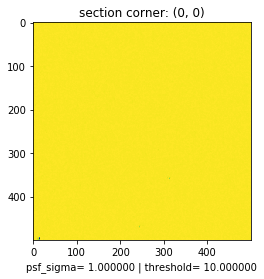

In [177]:
finder = pyradon.finder.Finder()
# finder.min_length = 10
result = finder.input(diff_imgs[true_indicies[83]][500:1000, 500:1000])

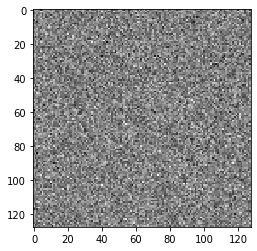

In [174]:
plt.imshow(normalize(finder.streaks[0].image_cutout), cmap="gray")

In [ ]:
plt.imshow(normalize(pairs[0][0]), cmap="gray")

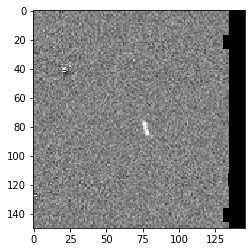

In [11]:
plt.imshow(normalize(diffs[0]), cmap="gray")

In [10]:
print(np.min(diff))

-2304.0671


In [11]:
np.sum(diff==(np.min(diff)-1))

0

(array([54568., 55148., 51475., 53106., 56540., 53886., 51604., 53571.,
        54422., 53235.]),
 array([-2304.0671, -2304.017 , -2303.967 , -2303.9172, -2303.8672,
        -2303.8171, -2303.767 , -2303.717 , -2303.6672, -2303.6172,
        -2303.5671], dtype=float32),
 <a list of 10 Patch objects>)

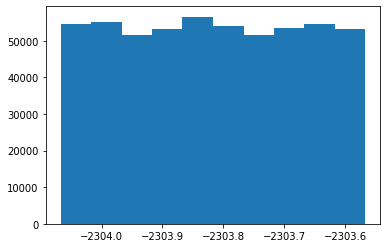

In [12]:
data = diff.flatten()[diff.flatten() < np.min(diff) + 1]
plt.hist(data)

In [13]:
diff = fits.getdata(diff_img)

NameError: name 'diff_img' is not defined

In [63]:
i = np.random.randint(1000)
diff_img = diff_files[i]

In [139]:
print(ref_files[true_indicies[0]])
print(diff_files[true_indicies[0]][:-len(".fz")])

/mnt/etdisk9/ztf_neos/ztf_visible/reference/ztf_000370_zr_c07_q1_refimg.fits
/mnt/etdisk9/ztf_neos/ztf_visible/difference/ztf_20180322303877_000370_zr_c07_o_q1_scimrefdiffimg.fits


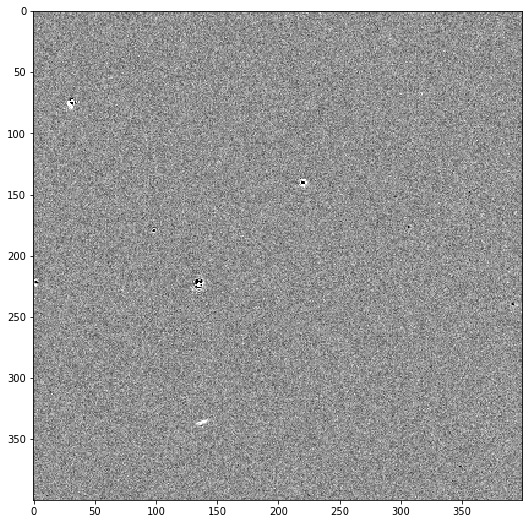

In [136]:
plt.imshow(normalize(fits.getdata(diff_files[true_indicies[0]][:-len(".fz")])[100:500, 500:900]), cmap="gray")

In [140]:
diff, ref = swarp_align(diff_files[true_indicies[0]][:-len(".fz")], ref_files[true_indicies[0]])

In [149]:
ref[ref==0] = np.nan
ref = np.array(ref, dtype=np.float64)
bkg = sep.Background(ref)

In [159]:
mask = ref > (bkg.back() + bkg.rms() * 10)

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


In [160]:
diff_copy = np.array(diff, dtype=np.float64)
diff_bkg = sep.Background(diff_copy)
diff_copy[mask] = diff_bkg.back()[mask]

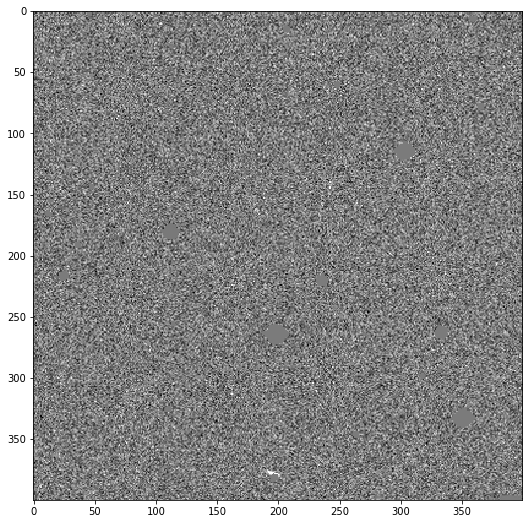

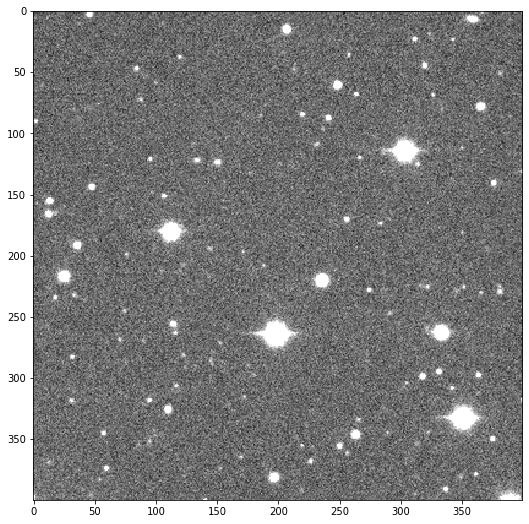

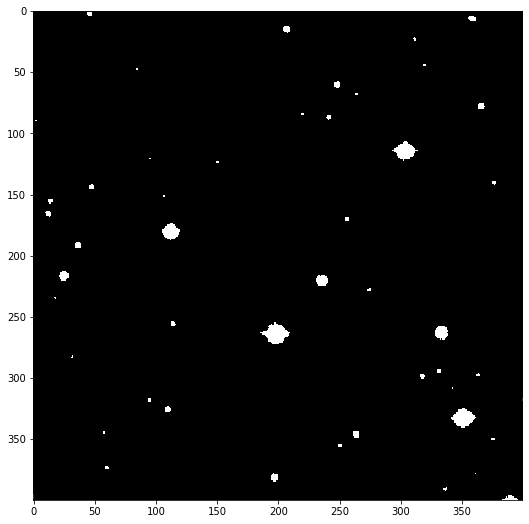

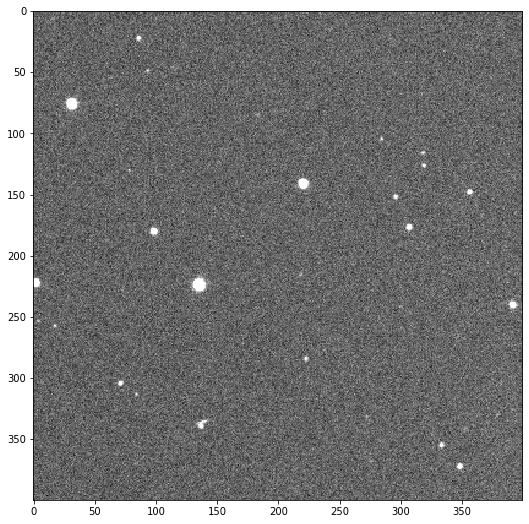

In [161]:
plt.imshow(normalize(diff_copy)[100:500, -900:-500], cmap="gray")
plt.figure()
plt.imshow(normalize(ref)[100:500, -900:-500], cmap="gray")
plt.figure()
plt.imshow(mask[100:500, -900:-500], cmap="gray")
plt.figure()
plt.imshow(normalize(fits.getdata(sci_files[true_indicies[0]]))[100:500, 500:900], cmap="gray")

In [162]:
diff_files_unpack = glob.glob("/mnt/etdisk9/ztf_neos/ztf_visible/difference/*.fits")

In [174]:
for diff_file, ref_file in tqdm(list(zip(diff_files_unpack, ref_files))):
    swarp_align(diff_file, ref_file)

In [164]:
import parmap

In [168]:
diff_files_unpack = [diff_file[:-len(".fz")] for diff_file in diff_files]

In [64]:
pairs_arr_indicies = np.where(preds.flatten() > 0.5)[0]
total = 0

streaks_list = []

for i in tqdm(list(range(len(true_indicies)))):
    
    if preds[pairs_arr_indicies[i]] < 0.95:
        continue
    
    if np.sum(~np.isfinite(diffs[true_indicies[i]])) > 100 or diffs[true_indicies[i]].shape != (size, size):
        continue
        
    total += 1
    streak = astride.Streak(diffs[true_indicies[i]], use_img=True, output_path="/home/fwang/Pipeline/",
                            contour_threshold=1.4, shape_cut=1, radius_dev_cut=0, area_cut=10, min_points=10, connectivity_angle=5)
    streak.detect()
    
    streaks_list.append((streak, i))
    

In [39]:
streaks_filtered = []
for streaks, i in tqdm(streaks_list):
    streaks_filtered.append(([], i))
    for streak in streaks.streaks:
        
#         print(streak)
        
        bbox = (streak["y_min"], streak["x_min"], streak["y_max"], streak["x_max"])
        
        if distance(bbox, (size//2, size//2), use_arr=True) < 20:
            streaks_filtered[-1][0].append(streak)

In [65]:
import morphsnakes as ms

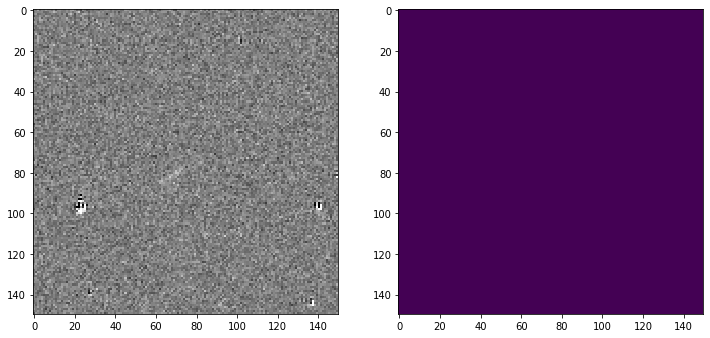

In [113]:
def visual_callback_2d(background, fig=None):
    """
    Returns a callback than can be passed as the argument `iter_callback`
    of `morphological_geodesic_active_contour` and
    `morphological_chan_vese` for visualizing the evolution
    of the levelsets. Only works for 2D images.
    
    Parameters
    ----------
    background : (M, N) array
        Image to be plotted as the background of the visual evolution.
    fig : matplotlib.figure.Figure
        Figure where results will be drawn. If not given, a new figure
        will be created.
    
    Returns
    -------
    callback : Python function
        A function that receives a levelset and updates the current plot
        accordingly. This can be passed as the `iter_callback` argument of
        `morphological_geodesic_active_contour` and
        `morphological_chan_vese`.
    
    """
    
    # Prepare the visual environment.
    if fig is None:
        fig = plt.figure()
    fig.clf()
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.imshow(background, cmap=plt.cm.gray)

    ax2 = fig.add_subplot(1, 2, 2)
    ax_u = ax2.imshow(np.zeros_like(background), vmin=0, vmax=1)
    plt.pause(0.001)

    def callback(levelset):
        
        if ax1.collections:
            del ax1.collections[0]
        ax1.contour(levelset, [0.5], colors='r')
        ax_u.set_data(levelset)
        fig.canvas.draw()
        plt.pause(0.001)

    return callback

# Initialization of the level-set.

img = diffs[true_indicies[29]]
init_ls = ms.circle_level_set(img.shape, radius=10)

# Callback for visual plotting
callback = visual_callback_2d(normalize(img))

# Morphological Chan-Vese (or ACWE)
result = ms.morphological_geodesic_active_contour(normalize(img), 150, init_level_set=img > np.std(img) * 2.5, iter_callback=callback, smoothing=1)


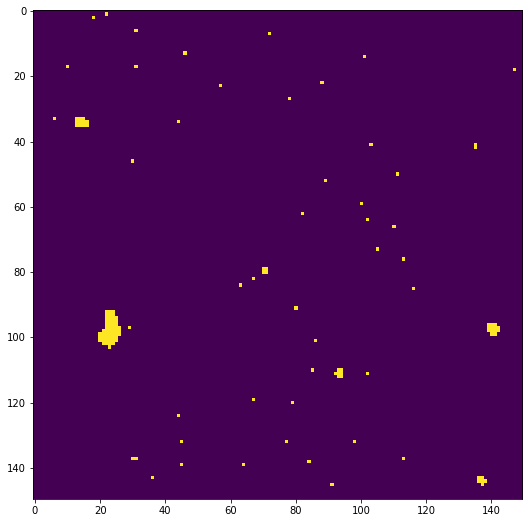

In [114]:
plt.imshow(result)

In [62]:
for i in range(len(streaks_list)):
    print(streaks_list[i][0]._std)

8.36401081085205
7.831188678741455
6.315861701965332
5.945602893829346
6.79419469833374
6.127394676208496
5.559937953948975
5.725198268890381
5.114284992218018
5.920991897583008
5.208120822906494
13.278510093688965
5.66020393371582
11.637025833129883
8.109770774841309
7.248053550720215
5.668074131011963
5.530104637145996
4.7315521240234375
12.147327423095703
13.116785049438477
11.015843391418457
12.752923965454102
12.593931198120117
12.0560941696167
11.508944511413574
11.855215072631836
12.680816650390625
14.477313041687012
14.085894584655762
12.651033401489258
12.292008399963379
12.205046653747559
11.134188652038574
11.281867980957031
13.029353141784668
24.270315170288086
20.130746841430664
5.6270527839660645
18.65319061279297
16.755035400390625
5.578308582305908
4.2450270652771
4.221572399139404
4.316081523895264
7.405232906341553
7.858219623565674
7.133659362792969
6.1244425773620605
6.045070171356201
7.505202770233154
7.544138431549072
7.424518585205078
7.504307746887207
6.98107242

20
23
33
34
62
65
66
89
94
95
103
119
171
184
185
192
212
222
235
238
240
246
292
317
328
343
344
389
423


/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


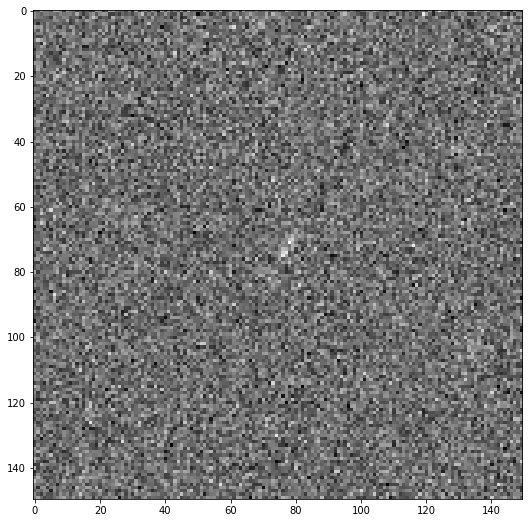

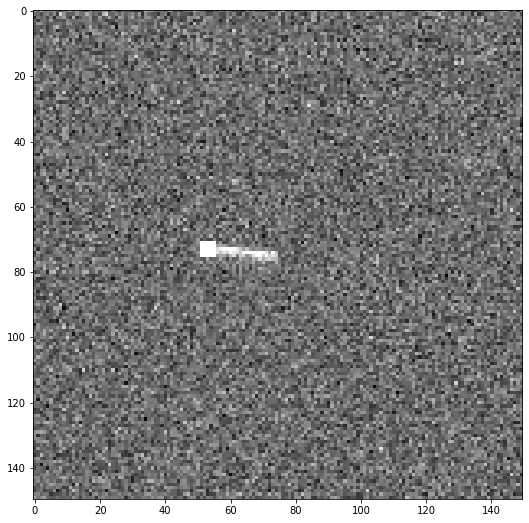

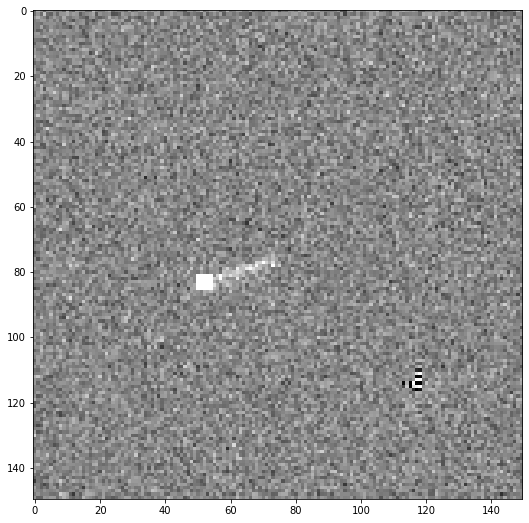

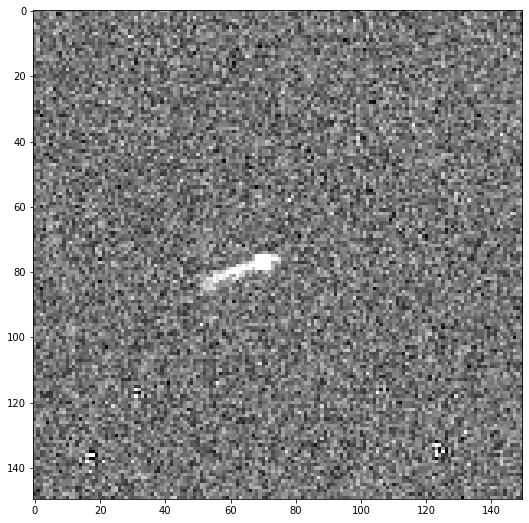

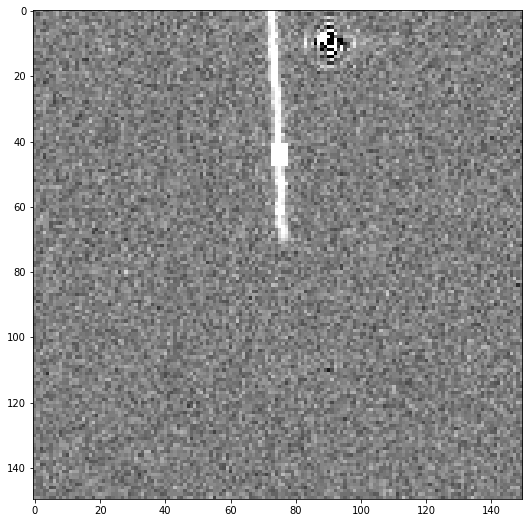

...

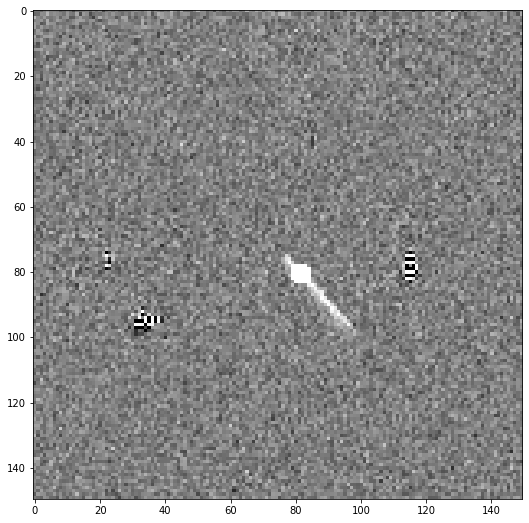

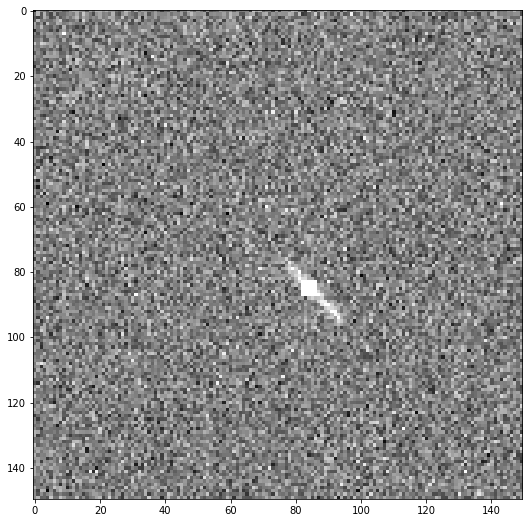

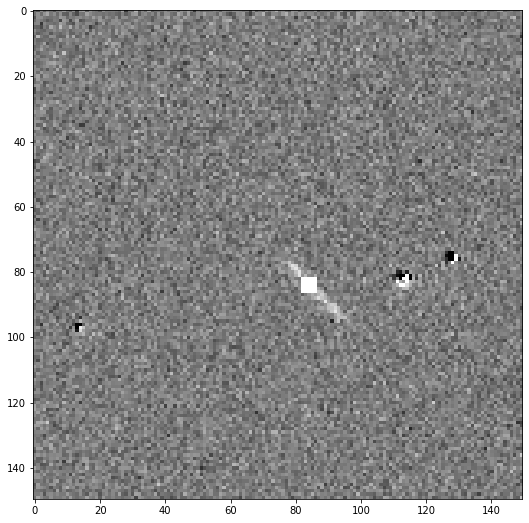

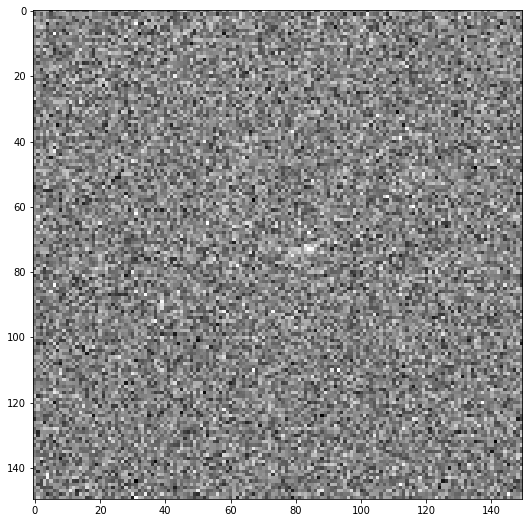

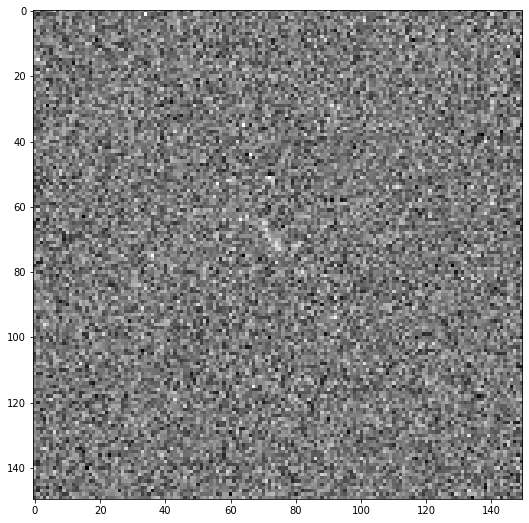

In [41]:
for streaks, i in streaks_filtered:
    if len(streaks) == 0:
        print(i)
        plt.figure()
        plt.imshow(normalize(diffs[true_indicies[i]]), cmap="gray")

In [18]:
from astride import Streak
import astride

In [86]:
print(bounds[true_indicies[10]])

[(88, 1498), (238, 1648)]


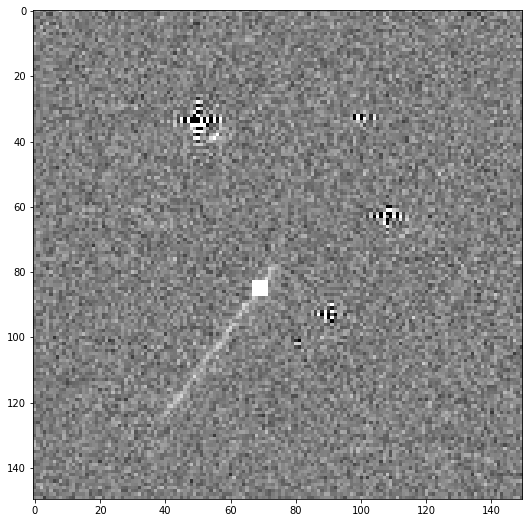

In [47]:
plt.imshow(normalize(diffs[true_indicies[95]]), cmap="gray")

In [227]:
import matplotlib

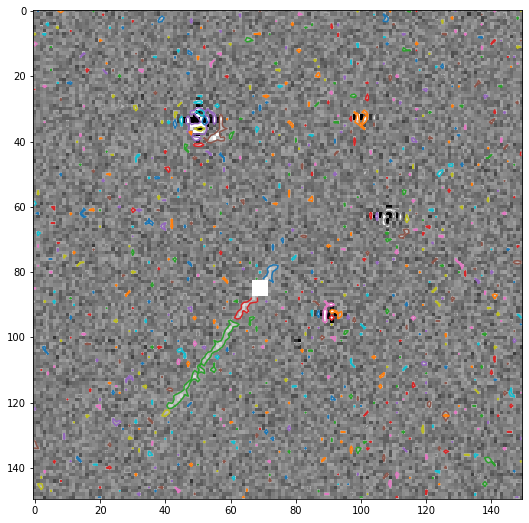

In [56]:
contours = skimage.measure.find_contours(diffs[true_indicies[95]], np.nanstd(diffs[true_indicies[95]]) * 1, fully_connected="high")
plt.imshow(normalize(diffs[true_indicies[95]]), cmap="gray")
# print(np.argmax([len(l) for l in contours]))
for contour in contours:
    y, x = zip(*contour)
    plt.plot(x, y)

# polygon = np.array(contours[0])[:, ::-1]
# left = np.min(polygon, axis=0)
# right = np.max(polygon, axis=0)
# x = np.arange(math.ceil(left[0]), math.floor(right[0])+1)
# y = np.arange(math.ceil(left[1]), math.floor(right[1])+1)
# xv, yv = np.meshgrid(x, y, indexing='xy')
# points = np.hstack((xv.reshape((-1,1)), yv.reshape((-1,1))))

# path = matplotlib.path.Path(polygon)
# mask = path.contains_points(points)
# mask.shape = xv.shape
# plt.figure()
# plt.imshow(mask)

In [245]:
A, perim, x_cen, y_cen, dists = astride.utils.edge.EDGE.get_shape_factor(None, polygon.T[0], polygon.T[1])
print(4 * np.pi * A / (perim ** 2))

0.41600049877562145


In [315]:
streak = Streak(diff_files[true_indicies[10]], hdu_index=1, contour_threshold=1.5, shape_cut=1, radius_dev_cut=0.1, area_cut=10, min_points=10, connectivity_angle=1)
streak.raw_image = diffs[true_indicies[10]]
streak.detect()

In [307]:
streak.streaks

[{'index': 1,
  'x': array([75.        , 74.        , 73.73649311, 73.        , 72.19398595,
         72.        , 71.06800287, 71.        , 70.        , 69.        ,
         68.        , 67.19812575, 68.        , 68.04890572, 68.        ,
         67.95630202, 67.        , 66.95470744, 66.        , 65.16007408,
         65.        , 64.4867582 , 64.        , 63.        , 62.        ,
         61.        , 60.08375049, 61.        , 61.74244099, 61.        ,
         60.72682734, 60.        , 59.        , 58.58077378, 59.        ,
         60.        , 60.33044153, 60.71575917, 60.        , 59.        ,
         58.        , 57.        , 56.        , 55.96887531, 55.        ,
         54.17708128, 54.20771051, 54.        , 53.64895766, 53.59198268,
         53.95430442, 53.        , 52.78582949, 53.        , 53.29871509,
         53.        , 52.46979241, 52.36167812, 53.        , 53.3459556 ,
         53.        , 52.70105528, 53.        , 53.27960486, 54.        ,
         54.587308 

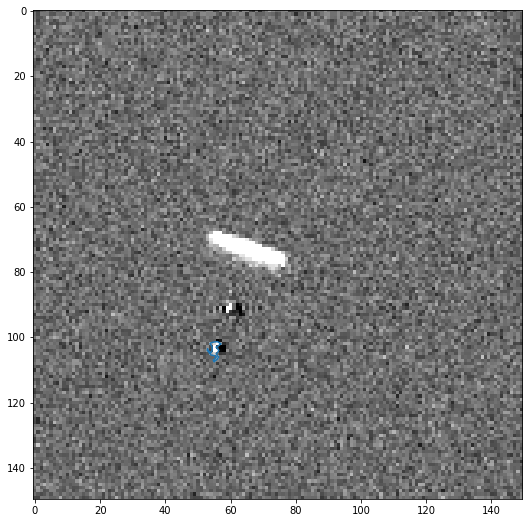

In [314]:
i = 1
plt.imshow(normalize(diffs[true_indicies[10]]), cmap="gray")
plt.plot(streak.streaks[i]["x"], streak.streaks[i]["y"])

In [313]:
i = 0
np.sum(curvature_splines(streak.streaks[i]["x"], streak.streaks[i]["y"], error=0.000000000000000001))

-18.67329487267392

In [279]:

from scipy.interpolate import UnivariateSpline
import numpy as np

def curvature_splines(x, y=None, error=0.1):
    """Calculate the signed curvature of a 2D curve at each point
    using interpolating splines.
    Parameters
    ----------
    x,y: numpy.array(dtype=float) shape (n_points, )
         or
         y=None and
         x is a numpy.array(dtype=complex) shape (n_points, )
         In the second case the curve is represented as a np.array
         of complex numbers.
    error : float
        The admisible error when interpolating the splines
    Returns
    -------
    curvature: numpy.array shape (n_points, )
    Note: This is 2-3x slower (1.8 ms for 2000 points) than `curvature_gradient`
    but more accurate, especially at the borders.
    """

    # handle list of complex case
    if y is None:
        x, y = x.real, x.imag

    t = np.arange(x.shape[0])
    std = error * np.ones_like(x)

    fx = UnivariateSpline(t, x, k=4, w=1 / np.sqrt(std))
    fy = UnivariateSpline(t, y, k=4, w=1 / np.sqrt(std))

    xˈ = fx.derivative(1)(t)
    xˈˈ = fx.derivative(2)(t)
    yˈ = fy.derivative(1)(t)
    yˈˈ = fy.derivative(2)(t)
    curvature = (xˈ* yˈˈ - yˈ* xˈˈ) / np.power(xˈ** 2 + yˈ** 2, 3 / 2)
    return curvature

In [95]:
streak.write_outputs()

In [96]:
x_border = streak.raw_borders[2]['x']
y_border = streak.raw_borders[2]['y']

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


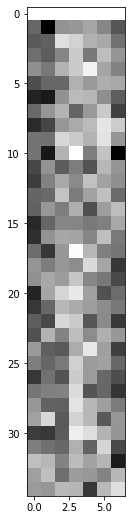

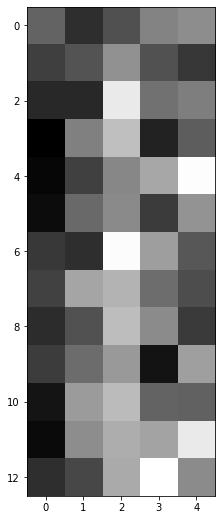

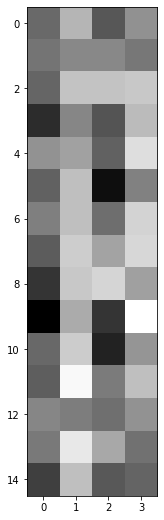

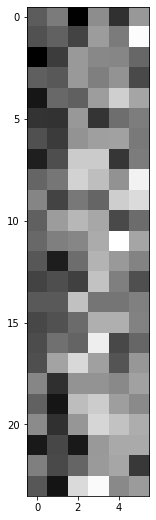

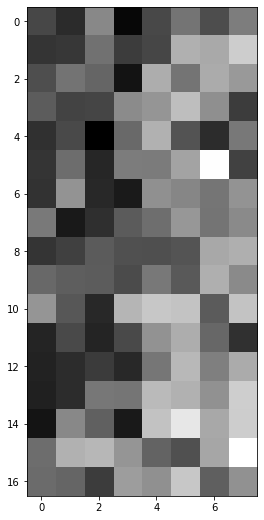

...

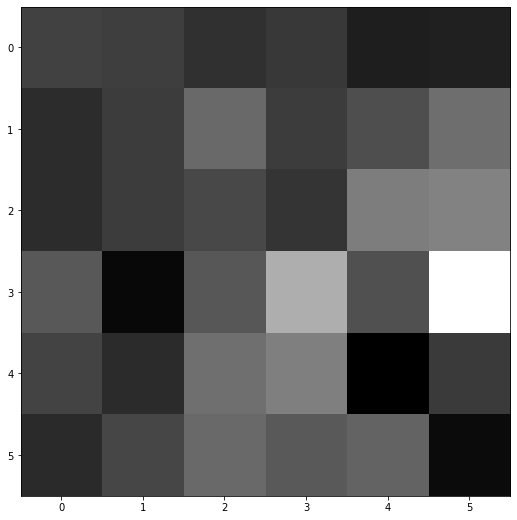

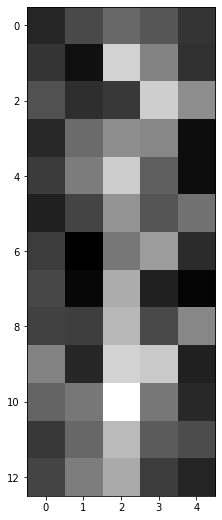

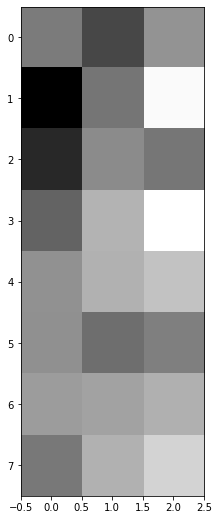

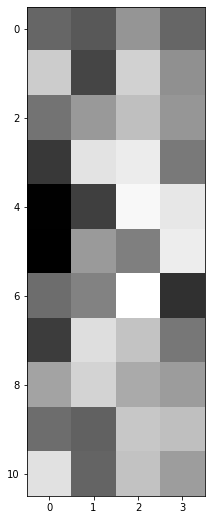

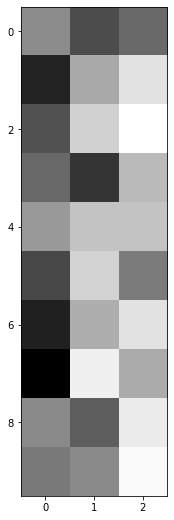

In [170]:
for i in range(len(streak.streaks)):
    x_min, x_max = int(streak.streaks[i]["x_min"]), int(streak.streaks[i]["x_max"])
    y_min, y_max = int(streak.streaks[i]["y_min"]), int(streak.streaks[i]["y_max"])
    plt.figure()
    plt.imshow(normalize(diff_imgs[true_indicies[10]][y_min:y_max, x_min:x_max]), cmap="gray")
# (x_min, y_min), (x_max, y_max) = bounds[true_indicies[10]]

In [164]:
print(x_min, x_max)
print(y_min, y_max)

273 363
1397 1460


In [172]:
(x_min, y_min), (x_max, y_max) = bounds[true_indicies[10]]

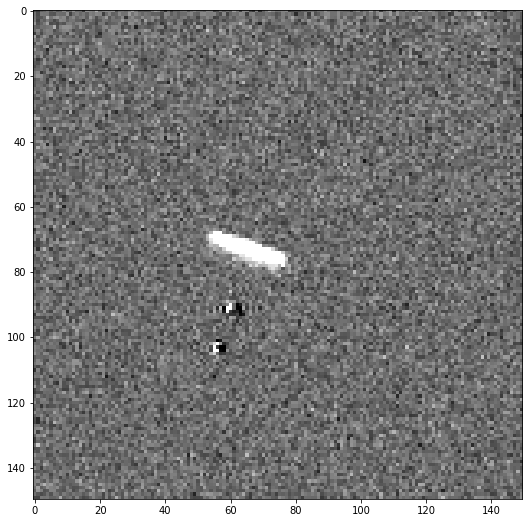

In [173]:
plt.imshow(normalize(fits.getdata(diff_files[true_indicies[10]])[y_min:y_max, x_min:x_max]), cmap="gray")

In [172]:
parmap.starmap(swarp_align, list(zip(diff_files_unpack, ref_files)), pm_pbar=True, pm_processes=2)

  0%|          | 0/975 [34:39<?, ?it/s]


KeyboardInterrupt: 